#**Практическое задание №1**

Установка необходимых пакетов:

In [ ]:
!pip install -q tqdm
!pip install --upgrade --no-cache-dir gdown

Монтирование Вашего Google Drive к текущему окружению:

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


Константы, которые пригодятся в коде далее, и ссылки (gdrive идентификаторы) на предоставляемые наборы данных:

In [ ]:
EVALUATE_ONLY = True
TEST_ON_LARGE_DATASET = True
TISSUE_CLASSES = ('ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM')
DATASETS_LINKS = {
    'train': '1XtQzVQ5XbrfxpLHJuL0XBGJ5U7CS-cLi',
    'train_small': '1qd45xXfDwdZjktLFwQb-et-mAaFeCzOR',
    'train_tiny': '1I-2ZOuXLd4QwhZQQltp817Kn3J0Xgbui',
    'test': '1RfPou3pFKpuHDJZ-D9XDFzgvwpUBFlDr',
    'test_small': '1wbRsog0n7uGlHIPGLhyN-PMeT2kdQ2lI',
    'test_tiny': '1viiB0s041CNsAK4itvX8PnYthJ-MDnQc'
}

In [ ]:
MODELS = {
    'BestModel': '1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O',
    'BigVGG': '1-hOGeDl4Zh_8knrkoSERmO1d5-VooLeB',
    'EfficientNetB0': '1-1qYvI51ORNTxKP4bp4ufFKe_ZLVpv2s',
    'VGG16': '1-LQeX4L_KDhRU6KXgABfinOA_tsg2wOk',
    '1model': '1-BIdzjfGErJQfZ33VRNRmwdCxTZHYUoA',
}

Импорт необходимых зависимостей:

In [ ]:
from pathlib import Path
import numpy as np
from typing import List
from tqdm.notebook import tqdm
from time import sleep
from PIL import Image
import IPython.display
from sklearn.metrics import balanced_accuracy_score
import gdown
import keras
from sklearn import svm
import matplotlib.pyplot as plt
from google.colab import drive
from tensorflow.keras.models import load_model
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from tensorflow.keras.models import load_model
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten
import tensorflow as tf
import joblib
from joblib import dump, load
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications import EfficientNetB0
from sklearn.metrics import confusion_matrix
import seaborn as sns
import albumentations as A
import random
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import InceptionV3

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


---
### Класс Dataset

Предназначен для работы с наборами данных, обеспечивает чтение изображений и соответствующих меток, а также формирование пакетов (батчей).

In [ ]:
class Dataset:

    def __init__(self, name, drive = True, new = True):
        self.name = name
        output = f'{name}.npz'
        self.is_loaded = False
        if drive and new:

            url = f"https://drive.google.com/uc?export=download&confirm=pbef&id={DATASETS_LINKS[name]}"
            gdown.download(url, output, quiet=False)
        if new:
            print(f'Loading dataset {self.name} from npz.')
            np_obj = np.load(f'{name}.npz')
            self.images = np_obj['data']
            self.labels = np_obj['labels']
            self.n_files = self.images.shape[0]
            self.is_loaded = True
            print(f'Done. Dataset {name} consists of {self.n_files} images.')

    def image(self, i):
        # read i-th image in dataset and return it as numpy array
        if self.is_loaded:
            return self.images[i, :, :, :]

    def images_seq(self, n=None):
        # sequential access to images inside dataset (is needed for testing)
        for i in range(self.n_files if not n else n):
            yield self.image(i)

    def random_image_with_label(self):
        # get random image with label from dataset
        i = np.random.randint(self.n_files)
        return self.image(i), self.labels[i]

    def random_batch_with_labels(self, n):
        # create random batch of images with labels (is needed for training)
        indices = np.random.choice(self.n_files, n)
        imgs = []
        for i in indices:
            img = self.image(i)
            imgs.append(self.image(i))
        logits = np.array([self.labels[i] for i in indices])
        return np.stack(imgs), logits

    def image_with_label(self, i: int):
        # return i-th image with label from dataset
        return self.image(i), self.labels[i]

### Пример использвания класса Dataset
Загрузим обучающий набор данных, получим произвольное изображение с меткой. После чего визуализируем изображение, выведем метку. В будущем, этот кусок кода можно закомментировать или убрать.


Got numpy array of shape (224, 224, 3), and label with code 8.
Label code corresponds to TUM class.


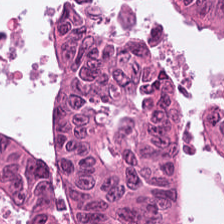

In [ ]:
d_train_tiny = Dataset('train_tiny')

img, lbl = d_train_tiny.random_image_with_label()
print()
print(f'Got numpy array of shape {img.shape}, and label with code {lbl}.')
print(f'Label code corresponds to {TISSUE_CLASSES[lbl]} class.')

pil_img = Image.fromarray(img)
IPython.display.display(pil_img)

---
### Класс Metrics

Реализует метрики точности, используемые для оценивания модели:
1. точность,
2. сбалансированную точность.

In [ ]:
class Metrics:

    @staticmethod
    def accuracy(gt: List[int], pred: List[int]):
        assert len(gt) == len(pred), 'gt and prediction should be of equal length'
        return sum(int(i[0] == i[1]) for i in zip(gt, pred)) / len(gt)

    @staticmethod
    def accuracy_balanced(gt: List[int], pred: List[int]):
        return balanced_accuracy_score(gt, pred)

    @staticmethod
    def print_all(gt: List[int], pred: List[int], info: str):
        print(f'metrics for {info}:')
        print('\t accuracy {:.4f}:'.format(Metrics.accuracy(gt, pred)))
        print('\t balanced accuracy {:.4f}:'.format(Metrics.accuracy_balanced(gt, pred)))

---
### Класс Model

Класс, хранящий в себе всю информацию о модели.

Вам необходимо реализовать методы save, load для сохранения и заргрузки модели. Особенно актуально это будет во время тестирования на дополнительных наборах данных.

> *Пожалуйста, убедитесь, что сохранение и загрузка модели работает корректно. Для этого обучите модель, протестируйте, сохраните ее в файл, перезапустите среду выполнения, загрузите обученную модель из файла, вновь протестируйте ее на тестовой выборке и убедитесь в том, что получаемые метрики совпадают с полученными для тестовой выбрки ранее.*


Также, Вы можете реализовать дополнительные функции, такие как:
1. валидацию модели на части обучающей выборки;
2. использование кроссвалидации;
3. автоматическое сохранение модели при обучении;
4. загрузку модели с какой-то конкретной итерации обучения (если используется итеративное обучение);
5. вывод различных показателей в процессе обучения (например, значение функции потерь на каждой эпохе);
6. построение графиков, визуализирующих процесс обучения (например, график зависимости функции потерь от номера эпохи обучения);
7. автоматическое тестирование на тестовом наборе/наборах данных после каждой эпохи обучения (при использовании итеративного обучения);
8. автоматический выбор гиперпараметров модели во время обучения;
9. сохранение и визуализацию результатов тестирования;
10. Использование аугментации и других способов синтетического расширения набора данных (дополнительным плюсом будет обоснование необходимости и обоснование выбора конкретных типов аугментации)
11. и т.д.

Полный список опций и дополнений приведен в презентации с описанием задания.

При реализации дополнительных функций допускается добавление параметров в существующие методы и добавление новых методов в класс модели.

In [ ]:
pip install medmnist

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 9.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=40473ab81e0651263bc525304d4409307d73b1d79d113df4b046847262514cd1
  Stored in directory: /root/.cache/pip/wheels/19/39/2f/2d3cadc408a8804103f1c34ddd4b9f6a93497b11fa96fe738e
Successfully built fire


###Для начала обучил (EfficientNetB0, VGG16), чтобы потом использовать их как экстракторы

#EfficientNetB0

In [ ]:


def create_efficientnet_model(input_shape=(32, 32, 3), num_classes=10):
    base_model = EfficientNetB0(weights=None, include_top=False, input_shape=input_shape)
    base_model.trainable = True

    x = base_model.output

    x = GlobalAveragePooling2D()(x)

    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.5)(x)

    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    return model


#data_small

In [ ]:
d_train_small = Dataset('train_small', drive = True)
d_test_small = Dataset('test_small', drive = True)

Downloading...
From: https://drive.google.com/uc?export=download&confirm=pbef&id=1qd45xXfDwdZjktLFwQb-et-mAaFeCzOR
To: /content/train_small.npz
100%|██████████| 841M/841M [00:07<00:00, 106MB/s]


Loading dataset train_small from npz.
Done. Dataset train_small consists of 7200 images.


Downloading...
From: https://drive.google.com/uc?export=download&confirm=pbef&id=1wbRsog0n7uGlHIPGLhyN-PMeT2kdQ2lI
To: /content/test_small.npz
100%|██████████| 211M/211M [00:02<00:00, 87.4MB/s]


Loading dataset test_small from npz.
Done. Dataset test_small consists of 1800 images.


#tiny

In [ ]:
d_train_tiny = Dataset('train_tiny', drive = True)
d_test_tiny = Dataset('test_tiny', drive = True)

Downloading...
From: https://drive.google.com/uc?export=download&confirm=pbef&id=1I-2ZOuXLd4QwhZQQltp817Kn3J0Xgbui
To: /content/train_tiny.npz
100%|██████████| 105M/105M [00:01<00:00, 66.2MB/s] 


Loading dataset train_tiny from npz.
Done. Dataset train_tiny consists of 900 images.


Downloading...
From: https://drive.google.com/uc?export=download&confirm=pbef&id=1viiB0s041CNsAK4itvX8PnYthJ-MDnQc
To: /content/test_tiny.npz
100%|██████████| 10.6M/10.6M [00:00<00:00, 236MB/s]

Loading dataset test_tiny from npz.
Done. Dataset test_tiny consists of 90 images.


# обучение EfficientNetB0

Из дополнительного:

    *Загрузка модели с какой-то конкретной итерации обучения (если используется итеративное обучение)
    *Построение матрицы ошибок, оценивание чувствительности и специфичности модели

In [ ]:
model = create_efficientnet_model(input_shape=(224, 224, 3), num_classes=9)

batch_size = 60
epochs = 5
checkpoint_path = "/content/drive/My Drive/checkpoints/model_epoch_{epoch:02d}.weights.h5"

callbacks = [
    ModelCheckpoint(filepath=checkpoint_path, save_best_only=False, save_weights_only=True, monitor='val_loss', mode='min'),
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
]
y_train_one_hot = to_categorical(d_train_small.labels, num_classes=9)
y_test_one_hot = to_categorical(d_test_small.labels, num_classes=9)

history = model.fit(
    d_train_small.images, y_train_one_hot,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(d_test_small.images, y_test_one_hot),
    callbacks=callbacks,
    shuffle=True
)



Epoch 1/5
120/120 ━━━━━━━━━━━━━━━━━━━━ 93s 302ms/step - accuracy: 0.3447 - loss: 1.8673 - val_accuracy: 0.1111 - val_loss: 2.5193
Epoch 2/5
120/120 ━━━━━━━━━━━━━━━━━━━━ 30s 250ms/step - accuracy: 0.6266 - loss: 0.9705 - val_accuracy: 0.1111 - val_loss: 4.3183
Epoch 3/5
120/120 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - accuracy: 0.6795 - loss: 0.9161 - val_accuracy: 0.2161 - val_loss: 2.6683
Epoch 4/5
120/120 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - accuracy: 0.7652 - loss: 0.6546 - val_accuracy: 0.3528 - val_loss: 2.3328
Epoch 5/5
120/120 ━━━━━━━━━━━━━━━━━━━━ 30s 250ms/step - accuracy: 0.8000 - loss: 0.5867 - val_accuracy: 0.4289 - val_loss: 2.4729


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


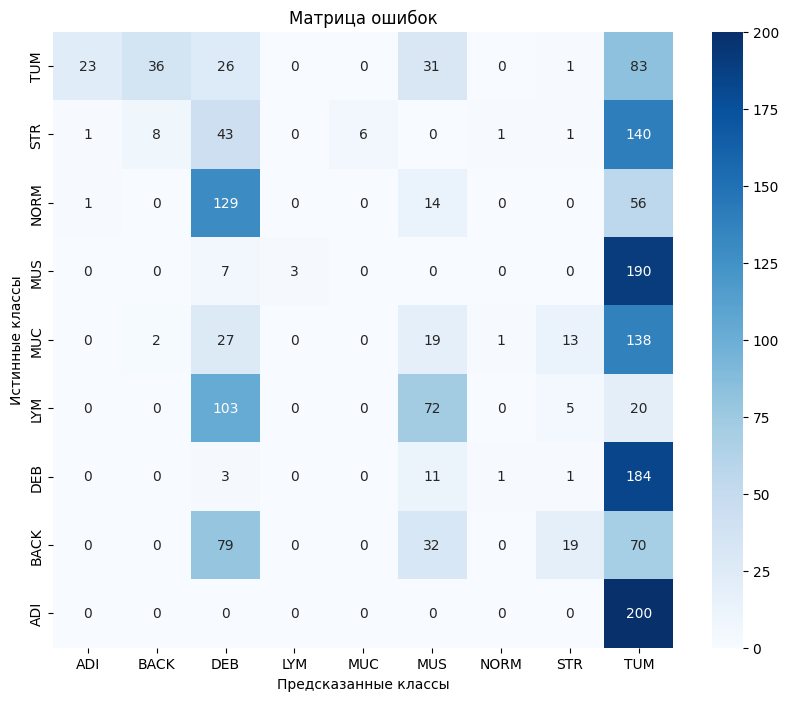

In [ ]:
y_true = d_test_small.labels
y_pred = np.argmax(model.predict(d_test_small.images), axis=1)

conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g', xticklabels=TISSUE_CLASSES, yticklabels=TISSUE_CLASSES[::-1])
plt.xlabel("Предсказанные классы")
plt.ylabel("Истинные классы")
plt.title("Матрица ошибок")
plt.show()

Загружаем модель с 3 эпохи обучаем дальше

In [ ]:
model.load_weights("/content/drive/My Drive/checkpoints/model_epoch_03.weights.h5")
model.fit(d_train_small.images, y_train_one_hot, epochs=5, initial_epoch=3, validation_data=(d_test_small.images, y_test_one_hot))

Epoch 4/5
225/225 ━━━━━━━━━━━━━━━━━━━━ 100s 192ms/step - accuracy: 0.7218 - loss: 0.8251 - val_accuracy: 0.6628 - val_loss: 0.9801
Epoch 5/5
225/225 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - accuracy: 0.7781 - loss: 0.6568 - val_accuracy: 0.2528 - val_loss: 6.7913


###Оценка качества модели

In [ ]:
test_loss, test_acc = model.evaluate(d_test.images, y_test_one_hot, verbose=2)

print(f'Test accuracy: {test_acc}')
print(f'Test loss: {test_loss}')



57/57 - 17s - 292ms/step - accuracy: 0.7511 - loss: 0.8308
Test accuracy: 0.7511110901832581
Test loss: 0.830771267414093


###Здесь, честно говоря, ради веселья добавил, чтобы модель переобучалась с параметров imagenet, но при этом ни один слой не замораживал. И результаты оказались получше, чем у прошлой модели))

Из дополнительного присутствует:

    *Вывод различных показателей в процессе обучения (например, значение функции потерь на каждой эпохе)
    *Автоматическое тестирование на тестовом наборе/наборах данных после каждой эпохи обучения (при использовании итеративного обучения)
    *валидация модели на части обучающей выборки: я так понял это просто разделение на d_train.images и d_train.labels?

In [ ]:


def create_vgg_model(input_shape=(224, 224, 3), num_classes=9):
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = True

    x = base_model.output

    x = GlobalAveragePooling2D()(x)

    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.5)(x)

    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    return model



modelVGG = create_vgg_model(input_shape=(224, 224, 3), num_classes=9)


batch_size = 60
epochs = 20

callbacks = [
    ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss', mode='min'),
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
]
y_train_one_hot = to_categorical(d_train_small.labels, num_classes=9)
y_test_one_hot = to_categorical(d_test_small.labels, num_classes=9)

history = modelVGG.fit(
    d_train_small.images, y_train_one_hot,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(d_test_small.images, y_test_one_hot),
    callbacks=callbacks,
    shuffle=True
)

drive.mount('/content/drive', force_remount=True)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
Epoch 1/20
120/120 ━━━━━━━━━━━━━━━━━━━━ 209s 1s/step - accuracy: 0.1155 - loss: 6.7437 - val_accuracy: 0.1433 - val_loss: 2.1405
Epoch 2/20
120/120 ━━━━━━━━━━━━━━━━━━━━ 114s 950ms/step - accuracy: 0.1618 - loss: 2.1122 - val_accuracy: 0.2472 - val_loss: 1.8901
Epoch 3/20
120/120 ━━━━━━━━━━━━━━━━━━━━ 114s 951ms/step - accuracy: 0.2730 - loss: 1.8478 - val_accuracy: 0.1822 - val_loss: 2.1443
Epoch 4/20
120/120 ━━━━━━━━━━━━━━━━━━━━ 116s 965ms/step - accuracy: 0.3180 - loss: 1.7179 - val_accuracy: 0.4894 - val_loss: 1.2310
Epoch 5/20
120/120 ━━━━━━━━━━━━━━━━━━━━ 116s 963ms/step - accuracy: 0.4964 - loss: 1.2650 - val_accuracy: 0.5517 - val_loss: 1.0963
Epoch 6/20
120/120 ━━━━━━━━━━━━━━━━━━━━ 115s 959ms/step - accuracy: 0.5581 - loss: 1.1089 - val_accuracy: 0.5539 - val_loss: 1.1346
Epoch 7/20
120/120 ━━━━━━━━━━━━━━━━━━━━ 115s 961ms/step - accuracy: 0.6193 - loss: 0.9977 - val_accuracy: 0.6483 - val_loss: 0.9156
Epoch 8/20
120/120 ━━━━━━━━━

###Здесь уже точность получилась более или менее приемлемая

In [ ]:
model_VGG = load_model("/content/drive/My Drive/models/VGG16.keras")
test_loss, test_acc = model_VGG.evaluate(d_test.images, y_test_one_hot, verbose=2)

print(f'Test accuracy: {test_acc}')
print(f'Test loss: {test_loss}')



57/57 - 30s - 518ms/step - accuracy: 0.8800 - loss: 0.3669
Test accuracy: 0.8799999952316284
Test loss: 0.36687713861465454


###Повторение модели VGG. Для основной модели построить график я забыл, а заново её обучать как-то не хотелось, в общем решил обучить такую же

In [ ]:
def create_vgg_model(input_shape=(224, 224, 3), num_classes=9):
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = True

    x = base_model.output

    x = GlobalAveragePooling2D()(x)

    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.5)(x)

    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    return model

RepeatModel = create_vgg_model(input_shape=(224, 224, 3), num_classes=9)


batch_size = 30
epochs = 20

callbacks = [
    ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss', mode='min'),
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
]
y_train_one_hot = to_categorical(d_train_small.labels, num_classes=9)
y_test_one_hot = to_categorical(d_test_small.labels, num_classes=9)
# d_train_small.images = d_train_small.images / 255.0


RepeatHistory = RepeatModel.fit(
    d_train_small.images, y_train_one_hot,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(d_test_small.images, y_test_one_hot),
    callbacks=callbacks,
    shuffle=True
)


Epoch 1/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 149s 463ms/step - accuracy: 0.1317 - loss: 6.5983 - val_accuracy: 0.2917 - val_loss: 1.8513
Epoch 2/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 116s 485ms/step - accuracy: 0.2905 - loss: 1.7954 - val_accuracy: 0.2878 - val_loss: 1.6599
Epoch 3/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 116s 484ms/step - accuracy: 0.3938 - loss: 1.4912 - val_accuracy: 0.4339 - val_loss: 1.3433
Epoch 4/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 116s 484ms/step - accuracy: 0.4582 - loss: 1.2899 - val_accuracy: 0.5500 - val_loss: 1.1539
Epoch 5/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 116s 484ms/step - accuracy: 0.4975 - loss: 1.2354 - val_accuracy: 0.5878 - val_loss: 1.0845
Epoch 6/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 115s 481ms/step - accuracy: 0.5223 - loss: 1.1909 - val_accuracy: 0.5656 - val_loss: 1.0887
Epoch 7/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 116s 483ms/step - accuracy: 0.5569 - loss: 1.1397 - val_accuracy: 0.6111 - val_loss: 0.9793
Epoch 8/20
240/240 ━━━━━━━━━━━━━━━━━━━━ 116s 485ms/step - accuracy: 0.6147 -

In [ ]:
test_loss, test_acc = RepeatModel.evaluate(d_test_small.images, y_test_one_hot, verbose=2)

print(f'Test accuracy: {test_acc}')
print(f'Test loss: {test_loss}')



57/57 - 12s - 218ms/step - accuracy: 0.7633 - loss: 0.5985
Test accuracy: 0.7633333206176758
Test loss: 0.5985029935836792


###График зависимости точности от эпохи

Из дополнительного присутствует:

    *Построение графиков, визуализирующих процесс обучения (график зависимости функции потерь от номера эпохи обучения)


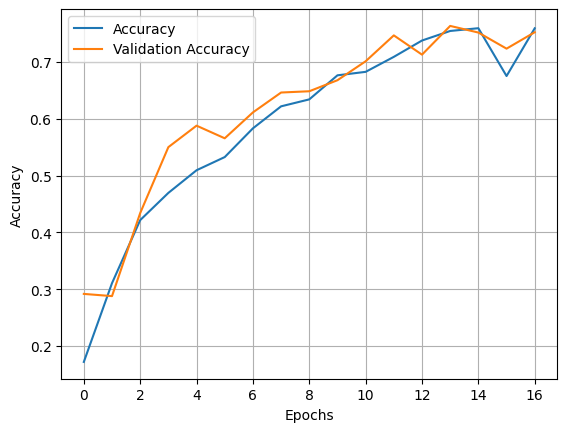

In [ ]:
plt.plot(RepeatHistory.history["accuracy"], label="Accuracy")
plt.plot(RepeatHistory.history["val_accuracy"], label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

#data_big

In [ ]:
d_test_big = Dataset('test')
d_train_big = Dataset('train')

Downloading...
From: https://drive.google.com/uc?export=download&confirm=pbef&id=1RfPou3pFKpuHDJZ-D9XDFzgvwpUBFlDr
To: /content/test.npz
100%|██████████| 525M/525M [00:05<00:00, 98.5MB/s]


Loading dataset test from npz.
Done. Dataset test consists of 4500 images.


Downloading...
From: https://drive.google.com/uc?export=download&confirm=pbef&id=1XtQzVQ5XbrfxpLHJuL0XBGJ5U7CS-cLi
To: /content/train.npz
100%|██████████| 2.10G/2.10G [00:16<00:00, 125MB/s]


Loading dataset train from npz.
Done. Dataset train consists of 18000 images.


###Здесь я дообучаю экстрактор уже на всех данных

Из дополнительного пристутствует:

    *Реализация возможности дообучения модели (на новом наборе данных, или, например, при экстренном закрытии Google Colab)


In [ ]:
BigModelVGG = load_model("/content/drive/My Drive/models/VGG16.keras")

batch_size = 60
epochs = 50

callbacks = [
    ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss', mode='min'),
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
]
y_train_one_hot = to_categorical(d_train_big.labels, num_classes=9)
y_test_one_hot = to_categorical(d_test_big.labels, num_classes=9)

history = BigModelVGG.fit(
    d_train_big.images, y_train_one_hot,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(d_test_big.images, y_test_one_hot),
    callbacks=callbacks,
    shuffle=True
)

BigModelVGG.save('/content/drive/My Drive/models/BigVGG.keras')
BigModelVGG.save('/content/drive/My Drive/models/BigVGG.h5')

Epoch 1/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 295s 970ms/step - accuracy: 0.8896 - loss: 0.3308 - val_accuracy: 0.8896 - val_loss: 0.3133
Epoch 2/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 287s 957ms/step - accuracy: 0.8927 - loss: 0.3233 - val_accuracy: 0.8931 - val_loss: 0.3393
Epoch 3/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 287s 958ms/step - accuracy: 0.9059 - loss: 0.2817 - val_accuracy: 0.8789 - val_loss: 0.3466
Epoch 4/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 288s 962ms/step - accuracy: 0.9194 - loss: 0.2381 - val_accuracy: 0.9267 - val_loss: 0.2313
Epoch 5/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 287s 958ms/step - accuracy: 0.9406 - loss: 0.1969 - val_accuracy: 0.8998 - val_loss: 0.2964
Epoch 6/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 287s 956ms/step - accuracy: 0.9353 - loss: 0.2034 - val_accuracy: 0.9367 - val_loss: 0.1958
Epoch 7/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 286s 953ms/step - accuracy: 0.9391 - loss: 0.1800 - val_accuracy: 0.9311 - val_loss: 0.2256
Epoch 8/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 286s 953ms/step - accuracy: 0.9483 -

###Уже конкурентоспособная точность

In [ ]:
model_VGG_bigboy = load_model("/content/drive/My Drive/models/BigVGG.keras")
test_loss, test_acc = model_VGG_bigboy.evaluate(d_test_big.images, y_test_one_hot, verbose=2)

print(f'Test accuracy: {test_acc}')
print(f'Test loss: {test_loss}')

141/141 - 34s - 238ms/step - accuracy: 0.9367 - loss: 0.1958
Test accuracy: 0.9366666674613953
Test loss: 0.1958276778459549


###Здесь я цепляю SVM на экстрактор
Из дополнительного:

    *не знаю считается ли это улучшением не из списка, но...

In [ ]:
modelBigVGG_SVM = load_model("/content/drive/My Drive/models/BigVGG.keras")

# x = modelBigVGG_SVM.output
x = modelBigVGG_SVM.layers[-2].output

feature_extractor = Model(inputs=modelBigVGG_SVM.input, outputs=x)

train_features = feature_extractor.predict(d_train.images)
test_features = feature_extractor.predict(d_test.images)

param_grid = {
    'kernel': ['linear', 'rbf', 'poly'],
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto']
}

svm = SVC()

grid_search = GridSearchCV(estimator=svm, param_grid=param_grid, cv=5, verbose=2, n_jobs=-1)

grid_search.fit(train_features, d_train.labels)

print("Best parameters found: ", grid_search.best_params_)

y_pred_SVM = grid_search.predict(test_features)

225/225 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step
57/57 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters found:  {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}


###Добавка к качеству есть)

In [ ]:
accuracy = accuracy_score(d_test_big.labels, y_pred_SVM)
print(f'Accuracy of SVM with EfficientNetB0 features: {accuracy}')

Accuracy of SVM with EfficientNetB0 features: 0.9388888888888889


###Попробовал вместо SVM случайный лес
Здесь из дополнительного присутствует:

    *Автоматическая кросс-валидация в grid_search
    *Автоматический выбор гиперпараметров модели во время обучения
    *Автоматическое сохранение и визуализация результатов тестирования: в best_params_ сохранены лучшие гиперпараметры модели

In [ ]:
x = modelBigVGG_SVM.layers[-2].output

feature_extractor = Model(inputs=modelBigVGG_SVM.input, outputs=x)

train_features = feature_extractor.predict(d_train_big.images)
test_features = feature_extractor.predict(d_test_big.images)

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_features': ['log2', 'sqrt'],
    'max_depth': [None, 10, 20, 30],
}

rf = RandomForestClassifier()

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, verbose=2, n_jobs=-1)

grid_search.fit(train_features, d_train_big.labels)

print("Best parameters found: ", grid_search.best_params_)

y_pred_RandomForest = grid_search.predict(test_features)

225/225 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step
57/57 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters found:  {'max_depth': None, 'max_features': 'sqrt', 'n_estimators': 200}


In [ ]:
accuracy = accuracy_score(d_test.labels, y_pred_RandomForest)
print(f'Accuracy of SVM with RandomForestClassifier features: {accuracy}')

Accuracy of SVM with RandomForestClassifier features: 0.9361111111111111


###Для случайного леса
Из дополнительного пристутствует:

    *Автоматическое сохранение модели при обучении

In [ ]:
my_model = My_Model(SVM_or_RandomForest="Forest")

In [ ]:
my_model.train(d_train_big)

563/563 ━━━━━━━━━━━━━━━━━━━━ 72s 127ms/step


In [ ]:
my_model.save("verybest")

In [ ]:
my_model_SVM = My_Model(SVM_or_RandomForest="SVM")
my_model_SVM.train(d_train_big)
my_model_SVM.save("verybestSVM")

563/563 ━━━━━━━━━━━━━━━━━━━━ 69s 121ms/step


---
### Классификация изображений

Используя введенные выше классы можем перейти уже непосредственно к обучению модели классификации изображений. Пример общего пайплайна решения задачи приведен ниже. Вы можете его расширять и улучшать. В данном примере используются наборы данных 'train_small' и 'test_small'.

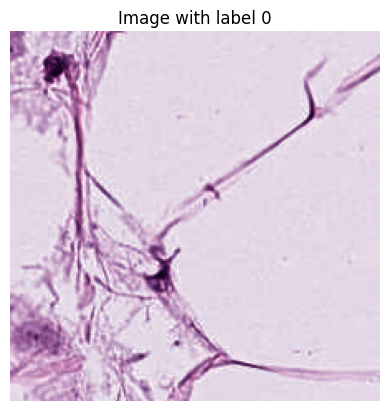

In [ ]:
def view(dataset, num = 0):
    plt.imshow(dataset.images[num])
    plt.axis('off')
    plt.title(f"Image with label {dataset.labels[num]}")
    plt.show()
view(d_train_big, 10)

###Я, так понял, здесь просто проверяется работа самого класса Model(который у меня назван My_Model, чтобы не было разногласий с Model из Keras), поэтому у меня есть model, которая я обучил на небольшом датасете и my_model, которую я обучил на большом датасете

In [ ]:
class My_Model:

    def __init__(self, SVM_or_RandomForest = "SVM", base_model = "BestModel", onlyNN = True):
        # todo
        self.onlyNN = onlyNN
        model = MODELS[base_model]
        try:
            url = f"https://drive.google.com/uc?export=download&id={model}"
            output = f'{base_model}.keras'
            gdown.download(url, output, quiet=False)
            modelBigVGG = load_model(f"/content/{output}")
        except Exception as e:
            print(f"Произошла ошибка при скачивании файла с диска: {e}")
        if not onlyNN:
            x = modelBigVGG.layers[-2].output
            self.feature_extractor = Model(inputs=modelBigVGG.input, outputs=x)

            if SVM_or_RandomForest == "SVM":
                self.model = SVC(kernel="rbf", C=10, gamma="scale")
            elif SVM_or_RandomForest == "Forest":
                self.model = RandomForestClassifier(max_depth=None, max_features="sqrt", n_estimators=200)
        else:
            self.model = modelBigVGG
        pass

    def save(self, name: str):
        if not self.onlyNN:
            dump(self.model, f'/content/drive/My Drive/models/{name}.joblib')
        else:
            self.model.save(f"/content/drive/My Drive/models/{name}.keras")
        pass

    def load(self, name = "BestModel"):
        # todo
        model = MODELS[name]
        url = f"https://drive.google.com/uc?export=download&id={model}"
        try:
            if not self.onlyNN:
                output = f'{name}.joblib'
                gdown.download(url, output, quiet=False)
                model_path = f'/content/{output}'
                self.model = load(model_path)
            else:
                output = f'{name}.keras'
                gdown.download(url, output, quiet=False)
                model_path = f'/content/{output}'
                self.model = load_model(f"/content/{output}")
        except Exception as e:
            print(f"Не получилось загрузить: {e}")
        print(f"Модель {name} загружена")
        pass
    def train(self, dataset: Dataset):
        self.train_features = self.feature_extractor.predict(dataset.images)
        self.model.fit(self.train_features, dataset.labels)
        try:
            dump(self.model, '/content/mymodel.joblib')
            print("Модель сохранена: mymodel")
        except Exception as e:
            print(f"Не удалось сохранить модель: {e}")
        pass
    def trainNN(self, train_images, train_labels, test_images, test_labels):
        batch_size = 20
        epochs = 100

        callbacks = [
            ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss', mode='min'),
            EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
            ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-6, verbose=1)
        ]

        y_train_one_hot = to_categorical(train_labels, num_classes=9)
        y_test_one_hot = to_categorical(test_labels, num_classes=9)

        if not hasattr(self, 'model') or self.model is None:
            raise ValueError("Модель не загружена или не существует. Загрузите модель перед дообучением.")

        if not hasattr(self.model, 'optimizer'):
            self.model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

        if not hasattr(self, "is_model_initialized") or not self.is_model_initialized:
            for layer in self.model.layers[:-3]:
                layer.trainable = False

            self.is_model_initialized = True

        history = self.model.fit(
            train_images, y_train_one_hot,
            batch_size=batch_size,
            epochs=epochs,
            validation_data=(test_images, y_test_one_hot),
            callbacks=callbacks,
            shuffle=True
        )

        try:
            self.model.save("mymodel")
            print("Модель сохранена: mymodel")
        except Exception as e:
            print(f"Не удалось сохранить модель: {e}")


    def test_on_dataset(self, dataset: Dataset, limit=None):
        # you can upgrade this code if you want to speed up testing using batches
        predictions = []
        n = dataset.n_files if not limit else int(dataset.n_files * limit)
        for img in tqdm(dataset.images_seq(n), total=n):
            predictions.append(self.test_on_image(img))
        return predictions

    def test_on_image(self, img: np.ndarray):
        # todo:
        batched_image = np.expand_dims(img, axis=0)
        if not self.onlyNN:
            features = self.feature_extractor.predict(batched_image)
            prediction = self.model.predict(features)
        else:
            prob = self.model.predict(batched_image)
            prediction = np.argmax(prob, axis=1)[0]
        return prediction


In [ ]:
model = My_Model()
model.train(d_train_small)
model.save('best')
model.load('best')

225/225 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step
Модель best загружена


Пример тестирования модели на части набора данных:

In [ ]:
pred_1 = model.test_on_dataset(d_test_small, limit=0.1)
Metrics.print_all(d_test_small.labels[:len(pred_1)], pred_1, '10%     of test')


  0%|          | 0/180 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━

<ipython-input-7-e71ce1dade46>:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return sum(int(i[0] == i[1]) for i in zip(gt, pred)) / len(gt)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


metrics for 10%     of test:

	 accuracy 0.9778:
	 balanced accuracy 0.9778:

Пример тестирования модели на полном наборе данных:

###my_model(Случайный лес) на d_test_big

In [ ]:
# evaluating model on full test dataset (may take time)
if TEST_ON_LARGE_DATASET:
    pred_2 = my_model.test_on_dataset(d_test_big)
    Metrics.print_all(d_test_big.labels, pred_2, 'test')

  0%|          | 0/4500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━

<ipython-input-7-e71ce1dade46>:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return sum(int(i[0] == i[1]) for i in zip(gt, pred)) / len(gt)


metrics for test:

	 accuracy 0.9467:
	 balanced accuracy 0.9467:


###my_model_SVM на d_test_big

In [ ]:
# evaluating model on full test dataset (may take time)
if TEST_ON_LARGE_DATASET:
    pred_2 = my_model_SVM.test_on_dataset(d_test_big)
    Metrics.print_all(d_test_big.labels, pred_2, 'test')

  0%|          | 0/4500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━

<ipython-input-7-e71ce1dade46>:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return sum(int(i[0] == i[1]) for i in zip(gt, pred)) / len(gt)


###Здесь такие значения, но слишком много step(by step))
metrics for test:

	 accuracy 0.9487:
	 balanced accuracy 0.9487:

###Здесь я n-раз запускал код, чтобы хотя бы одна картинка была предсказана неверно

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


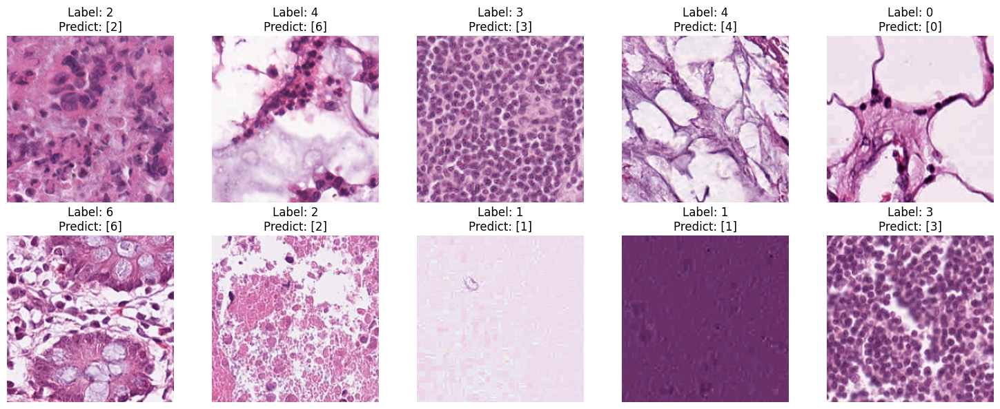

In [ ]:
images = d_test_tiny.images
labels = d_test_tiny.labels

n_rows = 2
n_cols = 5
n_images = n_rows * n_cols

if len(images) > n_images:
    random_indices = random.sample(range(len(images)), n_images)
    sampled_images = [images[i] for i in random_indices]
    sampled_labels = [labels[i] for i in random_indices]
else:
    sampled_images = images
    sampled_labels = labels

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3))

for i, ax in enumerate(axes.ravel()):
    if i < len(sampled_images):
        ax.imshow(sampled_images[i], cmap='gray')
        ax.axis('off')
        prediction = my_model_SVM.test_on_image(sampled_images[i])
        ax.set_title(f"Label: {sampled_labels[i]}\nPredict: {prediction}")
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()


Результат работы пайплайна обучения и тестирования выше тоже будет оцениваться. Поэтому не забудьте присылать на проверку ноутбук с выполнеными ячейками кода с демонстрациями метрик обучения, графиками и т.п. В этом пайплайне Вам необходимо продемонстрировать работу всех реализованных дополнений, улучшений и т.п.

<font color="red">
Настоятельно рекомендуется после получения пайплайна с полными результатами обучения экспортировать ноутбук в pdf (файл -> печать) и прислать этот pdf вместе с самим ноутбуком.
</font>

### Тестирование модели на других наборах данных

Ваша модель должна поддерживать тестирование на других наборах данных. Для удобства, Вам предоставляется набор данных test_tiny, который представляет собой малую часть (2% изображений) набора test. Ниже приведен фрагмент кода, который будет осуществлять тестирование для оценивания Вашей модели на дополнительных тестовых наборах данных.

<font color="red">
Прежде чем отсылать задание на проверку, убедитесь в работоспособности фрагмента кода ниже.
</font>

In [ ]:
final_model = My_Model()
final_model.load('verybest')
d_test_tiny = Dataset('test_tiny')
pred = final_model.test_on_dataset(d_test_tiny)
Metrics.print_all(d_test_tiny.labels, pred, 'test-tiny')

Модель verybest загружена


Downloading...
From: https://drive.google.com/uc?export=download&confirm=pbef&id=1viiB0s041CNsAK4itvX8PnYthJ-MDnQc
To: /content/drive/MyDrive/data/test_tiny.npz
100%|██████████| 10.6M/10.6M [00:00<00:00, 73.8MB/s]


Loading dataset test_tiny from npz.
Done. Dataset test_tiny consists of 90 images.


  0%|          | 0/90 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━

<ipython-input-7-e71ce1dade46>:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return sum(int(i[0] == i[1]) for i in zip(gt, pred)) / len(gt)


metrics for test-tiny:

	 accuracy 0.9000:
	 balanced accuracy 0.9000:

In [ ]:
final_model_SVM = My_Model()
final_model_SVM.load('verybestSVM')
d_test_tiny = Dataset('test_tiny')
pred = final_model_SVM.test_on_dataset(d_test_tiny)
Metrics.print_all(d_test_tiny.labels, pred, 'test-tiny')

Модель verybestSVM загружена


Downloading...
From: https://drive.google.com/uc?export=download&confirm=pbef&id=1viiB0s041CNsAK4itvX8PnYthJ-MDnQc
To: /content/drive/My Drive/data/test_tiny.npz
100%|██████████| 10.6M/10.6M [00:00<00:00, 70.2MB/s]


Loading dataset test_tiny from npz.
Done. Dataset test_tiny consists of 90 images.


  0%|          | 0/90 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━

<ipython-input-7-e71ce1dade46>:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return sum(int(i[0] == i[1]) for i in zip(gt, pred)) / len(gt)


metrics for test-tiny:

	 accuracy 0.9000:
	 balanced accuracy 0.9000:

#Здесь я пытаюсь обучить самую качественную модель с помощью аугментации
###Посмотрев на изображения, мне показалось, имеет смысл использовать различные геометрические преобразования, возможно поможет размытие ...


In [ ]:
import albumentations as A

def get_augmentation_pipeline():
    return A.Compose(
        [
            # Геометрические преобразования
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.3),
            A.ShiftScaleRotate(
                shift_limit=0.1, scale_limit=0.1, rotate_limit=10, p=0.5
            ),
            A.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=0.5),
            A.GridDistortion(num_steps=5, distort_limit=0.3, p=0.4),
            A.OpticalDistortion(distort_limit=0.05, shift_limit=0.05, p=0.3),

            # Добавление шума и размытия
            A.OneOf(
                [
                    A.GaussianBlur(blur_limit=(3, 5), p=0.4),
                    A.MotionBlur(blur_limit=3, p=0.4),
                    A.GaussNoise(var_limit=(10, 30), p=0.4),
                ],
                p=0.5
            ),

            # Изменение цветовых каналов
            A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=15, val_shift_limit=10, p=0.5),
            A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.4),
            A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),

            # Обрезка и маскирование
            A.RandomResizedCrop(height=224, width=224, scale=(0.8, 1.0), ratio=(0.9, 1.1), p=0.5),
            A.CoarseDropout(max_holes=4, max_height=20, max_width=20, fill_value=0, p=0.5)
        ]
    )


def apply_batch_augmentations(batch_images):
    aug_pipeline = get_augmentation_pipeline()
    augmented_images = []

    for i in range(batch_images.shape[0]):
        augmented = aug_pipeline(image=batch_images[i])
        augmented_images.append(augmented["image"])

    return np.array(augmented_images)

In [ ]:
augmented_tensor = apply_batch_augmentations(d_train_tiny.images)

<ipython-input-45-4b665b856090>:12: UserWarning: Argument 'alpha_affine' is not valid and will be ignored.
  A.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=0.5),


<ipython-input-45-4b665b856090>:12: UserWarning: Argument 'alpha_affine' is not valid and will be ignored.
  A.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=0.5),


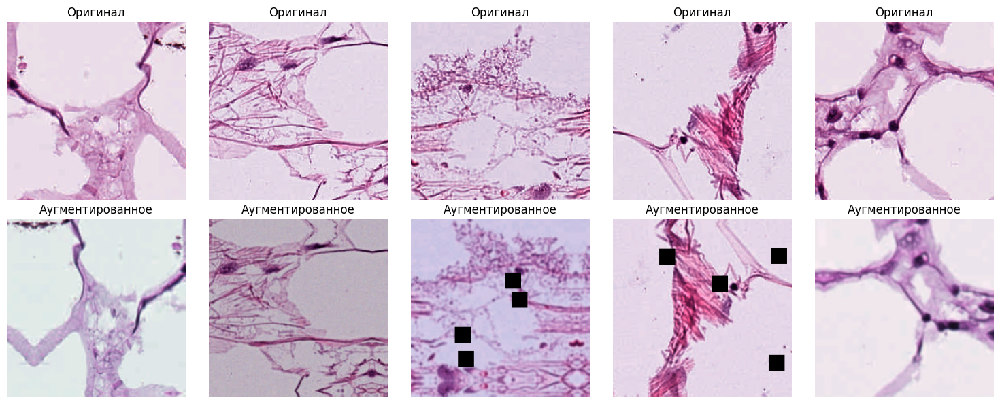

In [ ]:
n_rows = 2
n_cols = 5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3))
for i in range(n_cols):
    axes[0, i].imshow(d_train_tiny.images[i], cmap='gray')
    axes[0, i].axis('off')
    axes[0, i].set_title("Оригинал")

    augmented_image = get_augmentation_pipeline()(image=d_train_tiny.images[i])['image']
    axes[1, i].imshow(augmented_image, cmap='gray')
    axes[1, i].axis('off')
    axes[1, i].set_title("Аугментированное")

plt.tight_layout()
plt.show()

#Аугментация больших данных

In [ ]:
BestModel = load_model("/content/drive/My Drive/models/BigVGG.keras")

In [ ]:
batch_size = 20
epochs = 100

callbacks = [
    ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss', mode='min'),
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-6, verbose=1)
]

y_train_one_hot = to_categorical(d_train_big.labels, num_classes=9)
y_test_one_hot = to_categorical(d_test_big.labels, num_classes=9)



def random_hsv(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(hsv)

    s = cv2.add(s, np.random.randint(-40, 40))
    v = cv2.add(v, np.random.randint(-30, 30))
    s = np.clip(s, 0, 255)
    v = np.clip(v, 0, 255)

    hsv = cv2.merge([h, s, v])
    image = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
    return image

datagen = ImageDataGenerator(
    rotation_range=15,             # Небольшие повороты на 15 градусов
    width_shift_range=0.2,         # Горизонтальные сдвиги до 20%
    height_shift_range=0.2,        # Вертикальные сдвиги до 20%
    shear_range=0.1,               # Искривление изображения
    zoom_range=[0.8, 1.2],         # Масштабирование (80% - 120%)
    horizontal_flip=True,          # Отражение по горизонтали
    vertical_flip=True,            # Отражение по вертикали
    brightness_range=[0.8, 1.2],   # Изменение яркости изображения
    channel_shift_range=20.0,      # Изменение цветов в канале RGB
    fill_mode='nearest',           # Заполнение пустых мест
    preprocessing_function=random_hsv  # Собственная обработка цвета, если необходимо
)

for layer in BestModel.layers[:-4]:
    layer.trainable = False

history = BestModel.fit(
    d_train_big.images, y_train_one_hot,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(d_test_big.images, y_test_one_hot),
    callbacks=callbacks,
    shuffle=True
)

Epoch 1/100
900/900 ━━━━━━━━━━━━━━━━━━━━ 126s 126ms/step - accuracy: 0.9619 - loss: 0.1213 - val_accuracy: 0.9453 - val_loss: 0.1755 - learning_rate: 0.0010
Epoch 2/100
900/900 ━━━━━━━━━━━━━━━━━━━━ 110s 122ms/step - accuracy: 0.9611 - loss: 0.1226 - val_accuracy: 0.9444 - val_loss: 0.1732 - learning_rate: 0.0010
Epoch 3/100
900/900 ━━━━━━━━━━━━━━━━━━━━ 109s 121ms/step - accuracy: 0.9638 - loss: 0.1127 - val_accuracy: 0.9442 - val_loss: 0.1809 - learning_rate: 0.0010
Epoch 4/100
900/900 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - accuracy: 0.9654 - loss: 0.1134
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
900/900 ━━━━━━━━━━━━━━━━━━━━ 109s 121ms/step - accuracy: 0.9654 - loss: 0.1134 - val_accuracy: 0.9471 - val_loss: 0.1774 - learning_rate: 0.0010
Epoch 5/100
900/900 ━━━━━━━━━━━━━━━━━━━━ 110s 122ms/step - accuracy: 0.9640 - loss: 0.1131 - val_accuracy: 0.9469 - val_loss: 0.1703 - learning_rate: 5.0000e-04
Epoch 6/100
900/900 ━━━━━━━━━━━━━━━━━━━━ 109s 122ms/step - 

In [ ]:
BestModel.save("/content/drive/My Drive/models/BestModel.keras")

In [ ]:
BestModelSVM = My_Model(onlyNN = True)

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 10 variables whereas the saved optimizer has 62 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
pred = BestModelSVM.test_on_dataset(d_test_tiny)
Metrics.print_all(d_test_tiny.labels, pred, 'test-tiny')

  0%|          | 0/90 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━

metrics for test-tiny:

	 accuracy 0.9111:
	 balanced accuracy 0.9111:

Здесь опять нацепил SVM

In [ ]:
BestModel_SVM = My_Model()

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 10 variables whereas the saved optimizer has 62 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
BestModel_SVM.train(d_train_big)
pred = BestModel_SVM.test_on_dataset(d_test_tiny)
Metrics.print_all(d_test_tiny.labels, pred, 'test-tiny')

563/563 ━━━━━━━━━━━━━━━━━━━━ 66s 118ms/step
Модель сохранена: mymodel


  0%|          | 0/90 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━

<ipython-input-12-e71ce1dade46>:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return sum(int(i[0] == i[1]) for i in zip(gt, pred)) / len(gt)


metrics for test-tiny:

	 accuracy 0.9000:
	 balanced accuracy 0.9000:

In [ ]:
NN = My_Model()
pred = NN.test_on_dataset(d_test_big)
Metrics.print_all(d_test_big.labels, pred, 'test-big')

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 10 variables whereas the saved optimizer has 62 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


  0%|          | 0/4500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━

In [ ]:
svm = My_Model(onlyNN = False)
svm.train(d_train_big)
pred = svm.test_on_dataset(d_test_big)
Metrics.print_all(d_test_big.labels, pred, 'test-big')

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 10 variables whereas the saved optimizer has 62 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


563/563 ━━━━━━━━━━━━━━━━━━━━ 67s 118ms/step
Модель сохранена: mymodel


  0%|          | 0/4500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━

<ipython-input-12-e71ce1dade46>:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return sum(int(i[0] == i[1]) for i in zip(gt, pred)) / len(gt)


Отмонтировать Google Drive.

In [ ]:
drive.flush_and_unmount()

---
# Дополнительные "полезности"

Ниже приведены примеры использования различных функций и библиотек, которые могут быть полезны при выполнении данного практического задания.

### Измерение времени работы кода

Измерять время работы какой-либо функции можно легко и непринужденно при помощи функции timeit из соответствующего модуля:

In [ ]:
import timeit

def factorial(n):
    res = 1
    for i in range(1, n + 1):
        res *= i
    return res


def f():
    return factorial(n=1000)

n_runs = 128
print(f'Function f is caluclated {n_runs} times in {timeit.timeit(f, number=n_runs)}s.')

Function f is caluclated 128 times in 0.0290673549998246s.


### Scikit-learn

Для использования "классических" алгоритмов машинного обучения рекомендуется использовать библиотеку scikit-learn (https://scikit-learn.org/stable/). Пример классификации изображений цифр из набора данных MNIST при помощи классификатора SVM:

Classification report for classifier SVC(gamma=0.001):
              precision    recall  f1-score   support

           0       1.00      0.99      0.99        88
           1       0.99      0.97      0.98        91
           2       0.99      0.99      0.99        86
           3       0.98      0.87      0.92        91
           4       0.99      0.96      0.97        92
           5       0.95      0.97      0.96        91
           6       0.99      0.99      0.99        91
           7       0.96      0.99      0.97        89
           8       0.94      1.00      0.97        88
           9       0.93      0.98      0.95        92

    accuracy                           0.97       899
   macro avg       0.97      0.97      0.97       899
weighted avg       0.97      0.97      0.97       899




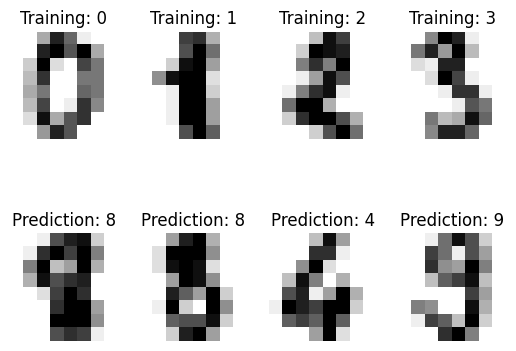

In [ ]:
# Standard scientific Python imports
import matplotlib.pyplot as plt

# Import datasets, classifiers and performance metrics
from sklearn import datasets, svm, metrics
from sklearn.model_selection import train_test_split

# The digits dataset
digits = datasets.load_digits()

# The data that we are interested in is made of 8x8 images of digits, let's
# have a look at the first 4 images, stored in the `images` attribute of the
# dataset.  If we were working from image files, we could load them using
# matplotlib.pyplot.imread.  Note that each image must have the same size. For these
# images, we know which digit they represent: it is given in the 'target' of
# the dataset.
_, axes = plt.subplots(2, 4)
images_and_labels = list(zip(digits.images, digits.target))
for ax, (image, label) in zip(axes[0, :], images_and_labels[:4]):
    ax.set_axis_off()
    ax.imshow(image, cmap=plt.cm.gray_r, interpolation='nearest')
    ax.set_title('Training: %i' % label)

# To apply a classifier on this data, we need to flatten the image, to
# turn the data in a (samples, feature) matrix:
n_samples = len(digits.images)
data = digits.images.reshape((n_samples, -1))

# Create a classifier: a support vector classifier
classifier = svm.SVC(gamma=0.001)

# Split data into train and test subsets
X_train, X_test, y_train, y_test = train_test_split(
    data, digits.target, test_size=0.5, shuffle=False)

# We learn the digits on the first half of the digits
classifier.fit(X_train, y_train)

# Now predict the value of the digit on the second half:
predicted = classifier.predict(X_test)

images_and_predictions = list(zip(digits.images[n_samples // 2:], predicted))
for ax, (image, prediction) in zip(axes[1, :], images_and_predictions[:4]):
    ax.set_axis_off()
    ax.imshow(image, cmap=plt.cm.gray_r, interpolation='nearest')
    ax.set_title('Prediction: %i' % prediction)

print("Classification report for classifier %s:\n%s\n"
      % (classifier, metrics.classification_report(y_test, predicted)))
# disp = metrics.plot_confusion_matrix(classifier, X_test, y_test)
# disp.figure_.suptitle("Confusion Matrix")
# print("Confusion matrix:\n%s" % disp.confusion_matrix)

# plt.show()

### Scikit-image

Реализовывать различные операции для работы с изображениями можно как самостоятельно, работая с массивами numpy, так и используя специализированные библиотеки, например, scikit-image (https://scikit-image.org/). Ниже приведен пример использования Canny edge detector.

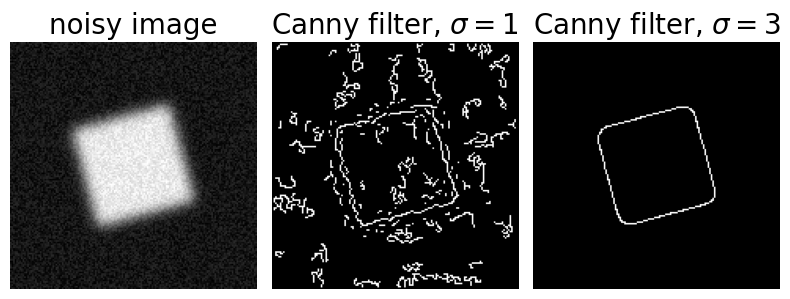

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi

from skimage import feature


# Generate noisy image of a square
im = np.zeros((128, 128))
im[32:-32, 32:-32] = 1

im = ndi.rotate(im, 15, mode='constant')
im = ndi.gaussian_filter(im, 4)
im += 0.2 * np.random.random(im.shape)

# Compute the Canny filter for two values of sigma
edges1 = feature.canny(im)
edges2 = feature.canny(im, sigma=3)

# display results
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(8, 3),
                                    sharex=True, sharey=True)

ax1.imshow(im, cmap=plt.cm.gray)
ax1.axis('off')
ax1.set_title('noisy image', fontsize=20)

ax2.imshow(edges1, cmap=plt.cm.gray)
ax2.axis('off')
ax2.set_title(r'Canny filter, $\sigma=1$', fontsize=20)

ax3.imshow(edges2, cmap=plt.cm.gray)
ax3.axis('off')
ax3.set_title(r'Canny filter, $\sigma=3$', fontsize=20)

fig.tight_layout()

plt.show()

### Tensorflow 2

Для создания и обучения нейросетевых моделей можно использовать фреймворк глубокого обучения Tensorflow 2. Ниже приведен пример простейшей нейроной сети, использующейся для классификации изображений из набора данных MNIST.

In [ ]:
# Install TensorFlow

import tensorflow as tf

mnist = tf.keras.datasets.mnist

(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0

model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(10, activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
history = model.fit(
    x_train,
    y_train,
    validation_data=(x_test, y_test),
    epochs=5
)
model.evaluate(x_test,  y_test, verbose=2)

Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8569 - loss: 0.4894 - val_accuracy: 0.9603 - val_loss: 0.1376
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.9558 - loss: 0.1529 - val_accuracy: 0.9675 - val_loss: 0.1077
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.9661 - loss: 0.1111 - val_accuracy: 0.9732 - val_loss: 0.0863
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.9727 - loss: 0.0882 - val_accuracy: 0.9754 - val_loss: 0.0826
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.9777 - loss: 0.0721 - val_accuracy: 0.9760 - val_loss: 0.0800
313/313 - 0s - 1ms/step - accuracy: 0.9760 - loss: 0.0800


[0.08003123104572296, 0.9760000109672546]

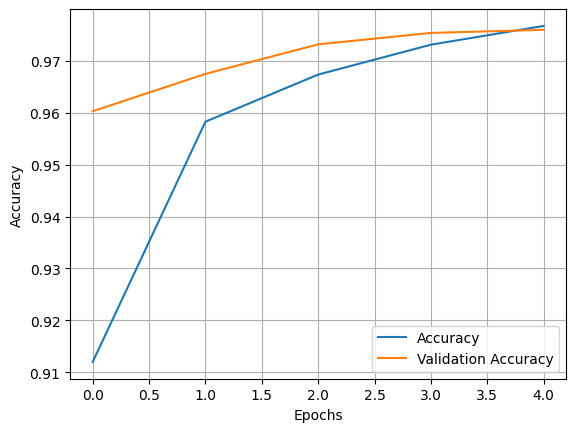

In [ ]:
plt.plot(history.history["accuracy"], label="Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

<font color="red">
Для эффективной работы с моделями глубокого обучения убедитесь в том, что в текущей среде Google Colab используется аппаратный ускоритель GPU или TPU. Для смены среды выберите "среда выполнения" -> "сменить среду выполнения".
</font>

Большое количество туториалов и примеров с кодом на Tensorflow 2 можно найти на официальном сайте https://www.tensorflow.org/tutorials?hl=ru.

Также, Вам может понадобиться написать собственный генератор данных для Tensorflow 2. Скорее всего он будет достаточно простым, и его легко можно будет реализовать, используя официальную документацию TensorFlow 2. Но, на всякий случай (если не удлось сразу разобраться или хочется вникнуть в тему более глубоко), можете посмотреть следующий отличный туториал: https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly.

### Numba

В некоторых ситуациях, при ручных реализациях графовых алгоритмов, выполнение многократных вложенных циклов for в python можно существенно ускорить, используя JIT-компилятор Numba (https://numba.pydata.org/).
Примеры использования Numba в Google Colab можно найти тут:
1. https://colab.research.google.com/github/cbernet/maldives/blob/master/numba/numba_cuda.ipynb
2. https://colab.research.google.com/github/evaneschneider/parallel-programming/blob/master/COMPASS_gpu_intro.ipynb

> Пожалуйста, если Вы решили использовать Numba для решения этого практического задания, еще раз подумайте, нужно ли это Вам, и есть ли возможность реализовать требуемую функциональность иным способом. Используйте Numba только при реальной необходимости.



### Работа с zip архивами в Google Drive

Запаковка и распаковка zip архивов может пригодиться при сохранении и загрузки Вашей модели. Ниже приведен фрагмент кода, иллюстрирующий помещение нескольких файлов в zip архив с последующим чтением файлов из него. Все действия с директориями, файлами и архивами должны осущетвляться с примонтированным Google Drive.


Создадим 2 изображения, поместим их в директорию tmp внутри PROJECT_DIR, запакуем директорию tmp в архив tmp.zip.

In [ ]:
PROJECT_DIR = "/data"
arr1 = np.random.rand(100, 100, 3) * 255
arr2 = np.random.rand(100, 100, 3) * 255

img1 = Image.fromarray(arr1.astype('uint8'))
img2 = Image.fromarray(arr2.astype('uint8'))

p = "/content/drive/MyDrive/" + PROJECT_DIR

if not (Path(p) / 'tmp').exists():
    (Path(p) / 'tmp').mkdir()

img1.save(str(Path(p) / 'tmp' / 'img1.png'))
img2.save(str(Path(p) / 'tmp' / 'img2.png'))

%cd $p
!zip -r "tmp.zip" "tmp"

/content/drive/MyDrive/data
  adding: tmp/ (stored 0%)
  adding: tmp/img1.png (stored 0%)
  adding: tmp/img2.png (stored 0%)


Распакуем архив tmp.zip в директорию tmp2 в PROJECT_DIR. Теперь внутри директории tmp2 содержится директория tmp, внутри которой находятся 2 изображения.

In [ ]:
p = "/content/drive/MyDrive/" + PROJECT_DIR
%cd $p
!unzip -uq "tmp.zip" -d "tmp2"

/content/drive/MyDrive/data


#Попытки улучшить качество

In [ ]:
d_train_small = Dataset("train_small")
d_test_small = Dataset("test_small")

Downloading...
From: https://drive.google.com/uc?export=download&confirm=pbef&id=1qd45xXfDwdZjktLFwQb-et-mAaFeCzOR
To: /content/train_small.npz
100%|██████████| 841M/841M [00:25<00:00, 33.4MB/s]


Loading dataset train_small from npz.
Done. Dataset train_small consists of 7200 images.


Downloading...
From: https://drive.google.com/uc?export=download&confirm=pbef&id=1wbRsog0n7uGlHIPGLhyN-PMeT2kdQ2lI
To: /content/test_small.npz
100%|██████████| 211M/211M [00:05<00:00, 36.2MB/s]


Loading dataset test_small from npz.
Done. Dataset test_small consists of 1800 images.


In [ ]:
d_train_tiny = Dataset("train_tiny")
d_test_tiny = Dataset("test_tiny")

Downloading...
From: https://drive.google.com/uc?export=download&confirm=pbef&id=1I-2ZOuXLd4QwhZQQltp817Kn3J0Xgbui
To: /content/train_tiny.npz
100%|██████████| 105M/105M [00:04<00:00, 24.6MB/s] 


Loading dataset train_tiny from npz.
Done. Dataset train_tiny consists of 900 images.


Downloading...
From: https://drive.google.com/uc?export=download&confirm=pbef&id=1viiB0s041CNsAK4itvX8PnYthJ-MDnQc
To: /content/test_tiny.npz
100%|██████████| 10.6M/10.6M [00:00<00:00, 17.1MB/s]

Loading dataset test_tiny from npz.
Done. Dataset test_tiny consists of 90 images.


In [ ]:
d_train = Dataset("train")
d_test = Dataset("test")

Downloading...
From: https://drive.google.com/uc?export=download&confirm=pbef&id=1XtQzVQ5XbrfxpLHJuL0XBGJ5U7CS-cLi
To: /content/train.npz
100%|██████████| 2.10G/2.10G [00:43<00:00, 47.9MB/s]


Loading dataset train from npz.
Done. Dataset train consists of 18000 images.


Downloading...
From: https://drive.google.com/uc?export=download&confirm=pbef&id=1RfPou3pFKpuHDJZ-D9XDFzgvwpUBFlDr
To: /content/test.npz
100%|██████████| 525M/525M [00:14<00:00, 36.3MB/s]


Loading dataset test from npz.
Done. Dataset test consists of 4500 images.


In [ ]:
svm = My_Model(onlyNN = False)

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O
From (redirected): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O&confirm=t&uuid=498710fb-1175-4c71-9f88-d47a098d1bb6
To: /content/BestModel.keras
100%|██████████| 183M/183M [00:01<00:00, 103MB/s]
/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 10 variables whereas the saved optimizer has 62 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
svm.train(d_train_tiny)
pred = svm.test_on_dataset(d_test_tiny)
Metrics.print_all(d_test_tiny.labels, pred, 'test-big')

29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step
Модель сохранена: mymodel


  0%|          | 0/90 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━

<ipython-input-15-e71ce1dade46>:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return sum(int(i[0] == i[1]) for i in zip(gt, pred)) / len(gt)


metrics for test-big:

	 accuracy 0.9000:
	 balanced accuracy 0.9000:

In [ ]:
svm.train(d_train_small)
pred = svm.test_on_dataset(d_test_small)
Metrics.print_all(d_test_small.labels, pred, 'test-big')

225/225 ━━━━━━━━━━━━━━━━━━━━ 24s 107ms/step
Модель сохранена: mymodel


  0%|          | 0/1800 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━

<ipython-input-15-e71ce1dade46>:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return sum(int(i[0] == i[1]) for i in zip(gt, pred)) / len(gt)


metrics for test-big:

	 accuracy 0.9394:
	 balanced accuracy 0.9394:

In [ ]:
svm.train(d_train)
pred = svm.test_on_dataset(d_test)
Metrics.print_all(d_test.labels, pred, 'test-big')

563/563 ━━━━━━━━━━━━━━━━━━━━ 74s 132ms/step
Модель сохранена: mymodel


  0%|          | 0/4500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━

<ipython-input-15-e71ce1dade46>:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return sum(int(i[0] == i[1]) for i in zip(gt, pred)) / len(gt)


metrics for test-big:
    
	 accuracy 0.9482:
	 balanced accuracy 0.9482:

In [ ]:
NN = My_Model()

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O
From (redirected): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O&confirm=t&uuid=2a7c5ecd-0766-41c4-9467-6a576514a059
To: /content/BestModel.keras
100%|██████████| 183M/183M [00:01<00:00, 138MB/s]
/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 10 variables whereas the saved optimizer has 62 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
pred = NN.test_on_dataset(d_test_tiny)
Metrics.print_all(d_test_tiny.labels, pred, 'test-big')

  0%|          | 0/90 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━

metrics for d_test_tiny:

	 accuracy 0.9111:
	 balanced accuracy 0.9111:

In [ ]:
pred = NN.test_on_dataset(d_test_small)
Metrics.print_all(d_test_small.labels, pred, 'test-big')

  0%|          | 0/1800 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━

metrics for d_test_small:

	 accuracy 0.9411:
	 balanced accuracy 0.9411:

In [ ]:
pred = NN.test_on_dataset(d_test)
Metrics.print_all(d_test.labels, pred, 'test-big')

  0%|          | 0/4500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━

metrics for d_test_big:

	 accuracy 0.9458:
	 balanced accuracy 0.9458:

In [ ]:
forest = My_Model(SVM_or_RandomForest="Forest",onlyNN = False)

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O
From (redirected): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O&confirm=t&uuid=e6c3994e-3418-4f08-a8b3-3dce8447ef2d
To: /content/BestModel.keras
100%|██████████| 183M/183M [00:01<00:00, 179MB/s]
/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 10 variables whereas the saved optimizer has 62 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
forest.train(d_train_tiny)
pred = forest.test_on_dataset(d_test_tiny)
Metrics.print_all(d_test_tiny.labels, pred, 'test-big')

29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step
Модель сохранена: mymodel


  0%|          | 0/90 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━

<ipython-input-15-e71ce1dade46>:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return sum(int(i[0] == i[1]) for i in zip(gt, pred)) / len(gt)


metrics for test-big:

	 accuracy 0.9111:
	 balanced accuracy 0.9111:

In [ ]:
forest.train(d_train_small)
pred = forest.test_on_dataset(d_test_small)
Metrics.print_all(d_test_small.labels, pred, 'test-big')

225/225 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step
Модель сохранена: mymodel


  0%|          | 0/1800 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━

<ipython-input-15-e71ce1dade46>:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return sum(int(i[0] == i[1]) for i in zip(gt, pred)) / len(gt)


metrics for test-big:

	 accuracy 0.9400:
	 balanced accuracy 0.9400:

In [ ]:
forest.train(d_train)
pred = forest.test_on_dataset(d_test)
Metrics.print_all(d_test.labels, pred, 'test-big')

563/563 ━━━━━━━━━━━━━━━━━━━━ 67s 119ms/step
Модель сохранена: mymodel


  0%|          | 0/4500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━

<ipython-input-15-e71ce1dade46>:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return sum(int(i[0] == i[1]) for i in zip(gt, pred)) / len(gt)


metrics for test-big:

	 accuracy 0.9484:
	 balanced accuracy 0.9484:

In [ ]:


def create_inception_model(input_shape=(224, 224, 3), num_classes=9):
    base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = True

    x = base_model.output

    x = GlobalAveragePooling2D()(x)

    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.5)(x)

    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    return model



inception = create_inception_model(input_shape=(224, 224, 3), num_classes=9)


batch_size = 60
epochs = 100

callbacks = [
    ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss', mode='min'),
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
]
y_train_one_hot = to_categorical(d_train.labels, num_classes=9)
y_test_one_hot = to_categorical(d_test.labels, num_classes=9)

history = inception.fit(
    d_train.images, y_train_one_hot,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(d_test.images, y_test_one_hot),
    callbacks=callbacks,
    shuffle=True
)



Epoch 1/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 205s 429ms/step - accuracy: 0.8186 - loss: 0.6241 - val_accuracy: 0.7842 - val_loss: 0.7472
Epoch 2/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 122s 408ms/step - accuracy: 0.9494 - loss: 0.1732 - val_accuracy: 0.6476 - val_loss: 1.7422
Epoch 3/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 124s 413ms/step - accuracy: 0.9581 - loss: 0.1395 - val_accuracy: 0.8707 - val_loss: 0.4534
Epoch 4/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 122s 407ms/step - accuracy: 0.9664 - loss: 0.1277 - val_accuracy: 0.8040 - val_loss: 0.6291
Epoch 5/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 124s 413ms/step - accuracy: 0.9723 - loss: 0.0894 - val_accuracy: 0.9262 - val_loss: 0.2784
Epoch 6/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 122s 407ms/step - accuracy: 0.9793 - loss: 0.0686 - val_accuracy: 0.6518 - val_loss: 1.9862
Epoch 7/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 122s 407ms/step - accuracy: 0.9784 - loss: 0.0678 - val_accuracy: 0.9018 - val_loss: 0.3697
Epoch 8/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 122s 407ms/step - accuracy: 

In [ ]:
# model_VGG_bigboy = load_model("/content/drive/My Drive/models/BigVGG.keras")
y_test_one_hot = to_categorical(d_test_small.labels, num_classes=9)
test_loss, test_acc = inception.evaluate(d_test_small.images, y_test_one_hot, verbose=2)

print(f'Test accuracy: {test_acc}')
print(f'Test loss: {test_loss}')

57/57 - 8s - 138ms/step - accuracy: 0.9267 - loss: 0.2912
Test accuracy: 0.9266666769981384
Test loss: 0.29121503233909607


In [ ]:
augmented_tensor = apply_batch_augmentations(d_train.images)

<ipython-input-9-f45bed83c1fe>:12: UserWarning: Argument 'alpha_affine' is not valid and will be ignored.
  A.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=0.5),


In [ ]:
combined_images = np.concatenate([d_train.images, augmented_tensor], axis=0)
combined_labels = np.concatenate([d_train.labels, d_train.labels], axis=0)

In [ ]:
model = My_Model()

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O
From (redirected): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O&confirm=t&uuid=92f21eb1-94bd-4820-8478-85d0d424f041
To: /content/BestModel.keras
100%|██████████| 183M/183M [00:00<00:00, 232MB/s]


In [ ]:
model.load()

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O
From (redirected): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O&confirm=t&uuid=2d711a88-3dbc-4e75-acb3-0c333951d286
To: /content/BestModel.keras
100%|██████████| 183M/183M [00:03<00:00, 53.5MB/s]


Модель BestModel загружена


In [ ]:
model.trainNN(combined_images, combined_labels, d_test.images, d_test.labels)

Epoch 1/100
1800/1800 ━━━━━━━━━━━━━━━━━━━━ 202s 105ms/step - accuracy: 0.8566 - loss: 0.5589 - val_accuracy: 0.9382 - val_loss: 0.2072 - learning_rate: 2.5000e-04
Epoch 2/100
1800/1800 ━━━━━━━━━━━━━━━━━━━━ 195s 108ms/step - accuracy: 0.8645 - loss: 0.4320 - val_accuracy: 0.9422 - val_loss: 0.1969 - learning_rate: 2.5000e-04
Epoch 3/100
1800/1800 ━━━━━━━━━━━━━━━━━━━━ 194s 108ms/step - accuracy: 0.8670 - loss: 0.4195 - val_accuracy: 0.9407 - val_loss: 0.1987 - learning_rate: 2.5000e-04
Epoch 4/100
1800/1800 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.8685 - loss: 0.4008
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
1800/1800 ━━━━━━━━━━━━━━━━━━━━ 195s 108ms/step - accuracy: 0.8685 - loss: 0.4008 - val_accuracy: 0.9409 - val_loss: 0.1989 - learning_rate: 2.5000e-04
Epoch 5/100
1800/1800 ━━━━━━━━━━━━━━━━━━━━ 195s 108ms/step - accuracy: 0.8722 - loss: 0.3939 - val_accuracy: 0.9409 - val_loss: 0.1955 - learning_rate: 1.2500e-04
Epoch 6/100
1800/1800 ━━━━━━━━━

In [ ]:
model1 = My_Model()

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O
From (redirected): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O&confirm=t&uuid=d1bae6f4-109b-4858-b42f-9222ee960a8b
To: /content/BestModel.keras
100%|██████████| 183M/183M [00:00<00:00, 262MB/s]
/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 10 variables whereas the saved optimizer has 62 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
model1.load("1model")

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1-BIdzjfGErJQfZ33VRNRmwdCxTZHYUoA
From (redirected): https://drive.google.com/uc?export=download&id=1-BIdzjfGErJQfZ33VRNRmwdCxTZHYUoA&confirm=t&uuid=66193db1-e37e-4e5e-a45b-430a47790801
To: /content/1model.keras
100%|██████████| 65.4M/65.4M [00:00<00:00, 180MB/s]


Модель 1model загружена


In [ ]:
pred = model1.test_on_dataset(d_test_small)
Metrics.print_all(d_test_small.labels, pred, 'test-big')

  0%|          | 0/1800 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━

metrics for test-big:

	 accuracy 0.9383:
	 balanced accuracy 0.9383:

In [ ]:
pred = model1.test_on_dataset(d_test_tiny)
Metrics.print_all(d_test_tiny.labels, pred, 'test-big')

  0%|          | 0/90 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━

metrics for test-big:

	 accuracy 0.9222:
	 balanced accuracy 0.9222:

In [ ]:
pred = model1.test_on_dataset(d_test)
Metrics.print_all(d_test.labels, pred, 'test-big')

  0%|          | 0/4500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━

metrics for test-big:

	 accuracy 0.9418:
	 balanced accuracy 0.9418:

In [ ]:
model2 = My_Model()

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O
From (redirected): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O&confirm=t&uuid=a3bc01bb-74f9-44e3-8d61-572d462cf761
To: /content/BestModel.keras
100%|██████████| 183M/183M [00:00<00:00, 274MB/s]
/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 10 variables whereas the saved optimizer has 62 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
model.trainNN(combined_images, combined_labels, d_test.images, d_test.labels)

Epoch 1/100
1800/1800 ━━━━━━━━━━━━━━━━━━━━ 188s 104ms/step - accuracy: 0.8718 - loss: 0.3887 - val_accuracy: 0.9413 - val_loss: 0.1951 - learning_rate: 6.2500e-05
Epoch 2/100
1800/1800 ━━━━━━━━━━━━━━━━━━━━ 194s 108ms/step - accuracy: 0.8780 - loss: 0.3723 - val_accuracy: 0.9427 - val_loss: 0.1912 - learning_rate: 6.2500e-05
Epoch 3/100
1800/1800 ━━━━━━━━━━━━━━━━━━━━ 194s 108ms/step - accuracy: 0.8760 - loss: 0.3797 - val_accuracy: 0.9404 - val_loss: 0.1936 - learning_rate: 6.2500e-05
Epoch 4/100
1800/1800 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.8762 - loss: 0.3754
Epoch 4: ReduceLROnPlateau reducing learning rate to 3.125000148429535e-05.
1800/1800 ━━━━━━━━━━━━━━━━━━━━ 194s 108ms/step - accuracy: 0.8762 - loss: 0.3754 - val_accuracy: 0.9427 - val_loss: 0.1933 - learning_rate: 6.2500e-05
Epoch 5/100
1800/1800 ━━━━━━━━━━━━━━━━━━━━ 194s 108ms/step - accuracy: 0.8768 - loss: 0.3700 - val_accuracy: 0.9420 - val_loss: 0.1913 - learning_rate: 3.1250e-05
Не удалось сохранить модель: In

In [ ]:
pred = model1.test_on_dataset(d_test_small)
Metrics.print_all(d_test_small.labels, pred, 'test-big')

In [ ]:
model = My_Model()
# model.load()

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O
From (redirected): https://drive.google.com/uc?export=download&id=1-C180uIULdZADmLNNvfaK8kNf6ArHJ3O&confirm=t&uuid=fc392e52-a043-4353-af1a-5b82d83c91ac
To: /content/BestModel.keras
100%|██████████| 183M/183M [00:01<00:00, 181MB/s]


In [ ]:
model.trainNN(d_train_tiny.images, d_train_tiny.labels, d_test_tiny.images, d_test_tiny.labels)

Epoch 1/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - accuracy: 0.9763 - loss: 0.0846 - val_accuracy: 0.9111 - val_loss: 0.3628 - learning_rate: 2.5000e-04
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - accuracy: 0.9525 - loss: 0.1065 - val_accuracy: 0.9111 - val_loss: 0.3626 - learning_rate: 2.5000e-04
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - accuracy: 0.9762 - loss: 0.0949 - val_accuracy: 0.9111 - val_loss: 0.3803 - learning_rate: 2.5000e-04
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - accuracy: 0.9776 - loss: 0.0648
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
45/45 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - accuracy: 0.9775 - loss: 0.0650 - val_accuracy: 0.9111 - val_loss: 0.3810 - learning_rate: 2.5000e-04
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - accuracy: 0.9716 - loss: 0.0818 - val_accuracy: 0.9111 - val_loss: 0.3800 - learning_rate: 1.2500e-04
Не удалось сохранить модель: Invalid filepath extension for sa

In [ ]:
model.trainNN(d_train_small.images, d_train_small.labels, d_test_small.images, d_test_small.labels)

Epoch 1/100
360/360 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - accuracy: 0.9704 - loss: 0.0961 - val_accuracy: 0.9422 - val_loss: 0.2012 - learning_rate: 1.2500e-04
Epoch 2/100
360/360 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - accuracy: 0.9701 - loss: 0.0909 - val_accuracy: 0.9428 - val_loss: 0.1974 - learning_rate: 1.2500e-04
Epoch 3/100
360/360 ━━━━━━━━━━━━━━━━━━━━ 83s 134ms/step - accuracy: 0.9706 - loss: 0.0895 - val_accuracy: 0.9406 - val_loss: 0.1974 - learning_rate: 1.2500e-04
Epoch 4/100
360/360 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - accuracy: 0.9707 - loss: 0.0932
Epoch 4: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.
360/360 ━━━━━━━━━━━━━━━━━━━━ 80s 129ms/step - accuracy: 0.9707 - loss: 0.0932 - val_accuracy: 0.9411 - val_loss: 0.1986 - learning_rate: 1.2500e-04
Epoch 5/100
360/360 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - accuracy: 0.9732 - loss: 0.0829 - val_accuracy: 0.9406 - val_loss: 0.1988 - learning_rate: 6.2500e-05
Epoch 6/100
360/360 ━━━━━━━━━━━━━━━━━━━━ 0s 102m

In [ ]:
pred = model.test_on_dataset(d_test_small)
Metrics.print_all(d_test_small.labels, pred, 'test-big')

  0%|          | 0/1800 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━

In [ ]:
pred = model.test_on_dataset(d_test)
Metrics.print_all(d_test.labels, pred, 'test-big')

  0%|          | 0/4500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━

In [ ]:
pred = model.test_on_dataset(d_test_tiny)
Metrics.print_all(d_test_tiny.labels, pred, 'test-big')

  0%|          | 0/90 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━